# HealthPredictor
<hr>

## Final Jupyter Notebook, Group 1 - Healthcare
## New Dataset
## CIS-579-002, Introduction to Artificial Intelligence
### Avinash Shete, Chandana Bhadravati Nagaraj, Jim Small, Ritesh Revansiddappa Honnalli

### Setup environment/notebook:

In [1]:
# Needed libraries:
# Standard Library:
from functools import partial
import math
import pickle
import shelve
from textwrap import fill

# 3rd Party:
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import display as display
import pandas as pd
import plotly.express as px
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import KNNImputer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier

# Suppress all warnings - remove for debugging/tuning:
# Note:  Only warning is from cell 34 because resulting plot is only of 1 class!
# import warnings
# warnings.filterwarnings('ignore')

plt.style.use('fivethirtyeight')
%matplotlib inline
pd.set_option('display.max_columns', 54)

# Track run number for serial execution:
# run_id = # is passed in
run_file = 'hp_results'

# Imputation type for missing numerical values:
# Either random or knn
IMPUTATION = 'knn'

In [2]:
# Load data:
# Note:  Using forward slashes ("/" versus "\") so works on both Windows and Linux/macOS:
data = './Data/chronickidneydisease-kaggle-1659x52.csv'
df = pd.read_csv(data)

# Explore first few rows:
df.head()

,PatientID,Age,Gender,Ethnicity,SocioeconomicStatus,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,SleepQuality,FamilyHistoryKidneyDisease,FamilyHistoryHypertension,FamilyHistoryDiabetes,PreviousAcuteKidneyInjury,UrinaryTractInfections,SystolicBP,DiastolicBP,FastingBloodSugar,HbA1c,SerumCreatinine,BUNLevels,GFR,ProteinInUrine,ACR,SerumElectrolytesSodium,SerumElectrolytesPotassium,SerumElectrolytesCalcium,SerumElectrolytesPhosphorus,HemoglobinLevels,CholesterolTotal,CholesterolLDL,CholesterolHDL,CholesterolTriglycerides,ACEInhibitors,Diuretics,NSAIDsUse,Statins,AntidiabeticMedications,Edema,FatigueLevels,NauseaVomiting,MuscleCramps,Itching,QualityOfLifeScore,HeavyMetalsExposure,OccupationalExposureChemicals,WaterQuality,MedicalCheckupsFrequency,MedicationAdherence,HealthLiteracy,Diagnosis,DoctorInCharge
0,1,71,0,0,0,2,31.069414,1,5.128112,1.676220,0.240386,4.076434,0,0,0,0,0,113,83,72.510788,9.212397,4.962531,25.605949,45.703204,0.744980,123.849426,137.652501,3.626058,10.314420,3.152648,16.114679,207.728670,85.863656,21.967957,212.095215,0,0,4.563139,1,0,0,3.563894,6.992244,4.518513,7.556302,76.076800,0,0,1,1.018824,4.966808,9.871449,1,Confidential
1,2,34,0,0,1,3,29.692119,1,18.609552,8.377574,6.503233,7.652813,1,1,0,0,0,120,67,100.848875,4.604989,3.156799,31.338166,55.784504,3.052317,88.539095,138.141335,5.332871,9.604196,2.855443,15.349205,189.450727,86.378670,87.569756,255.451314,0,0,9.097002,0,0,0,5.327336,0.356290,2.202222,6.836766,40.128498,0,0,0,3.923538,8.189275,7.161765,1,Confidential
2,3,80,1,1,0,1,37.394822,1,11.882429,9.607401,2.104828,4.392786,0,0,0,0,0,147,106,160.989441,5.432599,3.698236,39.738169,67.559032,1.157839,21.170892,142.970116,4.330891,9.885786,4.353513,13.018834,284.137622,132.269872,20.049798,251.902583,0,1,3.851249,1,0,0,4.855420,4.674069,5.967271,2.144722,92.872842,0,1,1,1.429906,7.624028,7.354632,1,Confidential
3,4,40,0,2,0,1,31.329680,0,16.020165,0.408871,6.964422,6.282274,0,0,0,0,0,117,65,188.506620,4.144466,2.868468,21.980958,33.202542,3.745871,123.779699,137.106913,3.810741,9.995894,4.016134,15.056339,235.112124,93.443669,58.260291,392.338425,0,0,7.881765,0,0,0,8.531685,5.691455,2.176387,7.077188,90.080321,0,0,0,3.226416,3.282688,6.629587,1,Confidential
4,5,43,0,1,1,2,23.726311,0,7.944146,0.780319,3.097796,4.021639,0,0,0,0,0,98,66,82.156699,4.262979,3.964877,12.216366,56.319082,2.570993,184.852046,140.627812,4.866765,8.907622,3.947907,16.690561,258.277566,171.758356,21.583213,370.523877,1,1,4.179459,1,0,0,1.422320,2.273459,6.800993,3.553118,5.258372,0,0,1,0.285466,3.849498,1.437385,1,Confidential


### First look at data/dataframe:

In [3]:
# Dimensions (rows, columns) of dataframe:
df.shape

(1659, 54)

In [4]:
# Show overview of dataframe columns:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1659 entries, 0 to 1658
Data columns (total 54 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   PatientID                      1659 non-null   int64  
 1   Age                            1659 non-null   int64  
 2   Gender                         1659 non-null   int64  
 3   Ethnicity                      1659 non-null   int64  
 4   SocioeconomicStatus            1659 non-null   int64  
 5   EducationLevel                 1659 non-null   int64  
 6   BMI                            1659 non-null   float64
 7   Smoking                        1659 non-null   int64  
 8   AlcoholConsumption             1659 non-null   float64
 9   PhysicalActivity               1659 non-null   float64
 10  DietQuality                    1659 non-null   float64
 11  SleepQuality                   1659 non-null   float64
 12  FamilyHistoryKidneyDisease     1659 non-null   i

In [5]:
# Show number of unique values per column:
df.nunique()

PatientID                        1659
Age                                71
Gender                              2
Ethnicity                           4
SocioeconomicStatus                 3
EducationLevel                      4
BMI                              1659
Smoking                             2
AlcoholConsumption               1659
PhysicalActivity                 1659
DietQuality                      1659
SleepQuality                     1659
FamilyHistoryKidneyDisease          2
FamilyHistoryHypertension           2
FamilyHistoryDiabetes               2
PreviousAcuteKidneyInjury           2
UrinaryTractInfections              2
SystolicBP                         90
DiastolicBP                        60
FastingBloodSugar                1659
HbA1c                            1659
SerumCreatinine                  1659
BUNLevels                        1659
GFR                              1659
ProteinInUrine                   1659
ACR                              1659
SerumElectro

In [6]:
# Examine descriptive statistics for each column - average, standard deviation, quartiles, and more:
df.describe()

,PatientID,Age,Gender,Ethnicity,SocioeconomicStatus,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,SleepQuality,FamilyHistoryKidneyDisease,FamilyHistoryHypertension,FamilyHistoryDiabetes,PreviousAcuteKidneyInjury,UrinaryTractInfections,SystolicBP,DiastolicBP,FastingBloodSugar,HbA1c,SerumCreatinine,BUNLevels,GFR,ProteinInUrine,ACR,SerumElectrolytesSodium,SerumElectrolytesPotassium,SerumElectrolytesCalcium,SerumElectrolytesPhosphorus,HemoglobinLevels,CholesterolTotal,CholesterolLDL,CholesterolHDL,CholesterolTriglycerides,ACEInhibitors,Diuretics,NSAIDsUse,Statins,AntidiabeticMedications,Edema,FatigueLevels,NauseaVomiting,MuscleCramps,Itching,QualityOfLifeScore,HeavyMetalsExposure,OccupationalExposureChemicals,WaterQuality,MedicalCheckupsFrequency,MedicationAdherence,HealthLiteracy,Diagnosis
count,1659.000000,1659.000000,1659.000000,1659.00000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000
mean,830.000000,54.441230,0.515371,0.71308,0.977697,1.693189,27.620049,0.292948,9.969831,5.024247,5.028544,6.942324,0.141049,0.301386,0.257384,0.105485,0.210368,134.392405,89.313442,132.529429,6.983682,2.753198,27.578147,66.829202,2.493736,149.881615,139.968984,4.505336,9.489156,3.505543,13.927304,224.251158,125.044597,60.746861,224.804603,0.295359,0.318264,5.011715,0.380952,0.202532,0.201929,5.016697,3.482121,3.525510,5.054869,49.730659,0.044002,0.103074,0.197107,2.000336,4.947788,5.144973,0.918626
std,479.056364,20.549757,0.499914,1.00043,0.776686,0.910611,7.288670,0.455252,5.798787,2.866274,2.865777,1.704159,0.348177,0.458998,0.437325,0.307270,0.407693,25.767794,17.354479,36.563035,1.734714,1.317168,12.808062,30.050836,1.449695,86.850287,2.905595,0.583963,0.574849,0.576634,2.338372,43.666586,42.645021,23.170415,100.321757,0.456341,0.465943,2.869813,0.485767,0.402007,0.401560,2.896311,1.986292,2.026131,2.880460,27.827593,0.205162,0.304147,0.397934,1.141635,2.869959,2.901138,0.273492
min,1.000000,20.000000,0.000000,0.00000,0.000000,0.000000,15.033888,0.000000,0.021740,0.001186,0.002407,4.001053,0.000000,0.000000,0.000000,0.000000,0.000000,90.000000,60.000000,70.044768,4.000405,0.501799,5.000249,15.107850,0.000900,0.178427,135.006489,3.503408,8.500033,2.503727,10.004223,150.015707,50.074597,20.030993,50.267668,0.000000,0.000000,0.000469,0.000000,0.000000,0.000000,0.015194,0.005171,0.006327,0.013697,0.087256,0.000000,0.000000,0.000000,0.001082,0.005392,0.004436,0.000000
25%,415.500000,36.000000,0.000000,0.00000,0.000000,1.000000,21.471449,0.000000,5.051156,2.555038,2.558443,5.487083,0.000000,0.000000,0.000000,0.000000,0.000000,113.000000,75.000000,100.504503,5.494988,1.583255,16.398275,41.149324,1.226335,76.784343,137.483563,3.993559,9.004488,2.984834,11.839478,186.440971,87.660348,41.252078,140.235507,0.000000,0.000000,2.619890,0.000000,0.000000,0.000000,2.464695,1.750661,1.820793,2.532867,26.991708,0.000000,0.000000,0.000000,1.005802,2.498119,2.569561,1.000000
50%,830.000000,54.000000,1.000000,0.00000,1.000000,2.000000,27.652077,0.000000,9.951503,5.072395,4.989810,6.933255,0.000000,0.000000,0.000000,0.000000,0.000000,134.000000,89.000000,131.478423,6.988001,2.732006,28.077796,66.555207,2.505260,150.195312,139.863171,4.505416,9.470789,3.511712,13.909388,223.202106,126.537520,61.845056,226.466365,0.000000,0.000000,5.078511,0.000000,0.000000,0.000000,5.117247,3.519894,3.572522,5.087086,48.970075,0.000000,0.000000,0.000000,2.040635,4.974069,5.182949,1.000000
75%,1244.500000,72.000000,1.0000

### Data Preprocessing:

In [7]:
# Save original DataFrame to allow extracting records by PatientID later on:
orig_df = df.copy()

# Remove id column:
df.drop('PatientID', axis=1, inplace=True)

# Remove doctor column - "Confidential" for all patients:
df.drop('DoctorInCharge', axis=1, inplace=True)

In [8]:
# Again look at first few rows to see column name changes:
df.head()

,Age,Gender,Ethnicity,SocioeconomicStatus,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,SleepQuality,FamilyHistoryKidneyDisease,FamilyHistoryHypertension,FamilyHistoryDiabetes,PreviousAcuteKidneyInjury,UrinaryTractInfections,SystolicBP,DiastolicBP,FastingBloodSugar,HbA1c,SerumCreatinine,BUNLevels,GFR,ProteinInUrine,ACR,SerumElectrolytesSodium,SerumElectrolytesPotassium,SerumElectrolytesCalcium,SerumElectrolytesPhosphorus,HemoglobinLevels,CholesterolTotal,CholesterolLDL,CholesterolHDL,CholesterolTriglycerides,ACEInhibitors,Diuretics,NSAIDsUse,Statins,AntidiabeticMedications,Edema,FatigueLevels,NauseaVomiting,MuscleCramps,Itching,QualityOfLifeScore,HeavyMetalsExposure,OccupationalExposureChemicals,WaterQuality,MedicalCheckupsFrequency,MedicationAdherence,HealthLiteracy,Diagnosis
0,71,0,0,0,2,31.069414,1,5.128112,1.676220,0.240386,4.076434,0,0,0,0,0,113,83,72.510788,9.212397,4.962531,25.605949,45.703204,0.744980,123.849426,137.652501,3.626058,10.314420,3.152648,16.114679,207.728670,85.863656,21.967957,212.095215,0,0,4.563139,1,0,0,3.563894,6.992244,4.518513,7.556302,76.076800,0,0,1,1.018824,4.966808,9.871449,1
1,34,0,0,1,3,29.692119,1,18.609552,8.377574,6.503233,7.652813,1,1,0,0,0,120,67,100.848875,4.604989,3.156799,31.338166,55.784504,3.052317,88.539095,138.141335,5.332871,9.604196,2.855443,15.349205,189.450727,86.378670,87.569756,255.451314,0,0,9.097002,0,0,0,5.327336,0.356290,2.202222,6.836766,40.128498,0,0,0,3.923538,8.189275,7.161765,1
2,80,1,1,0,1,37.394822,1,11.882429,9.607401,2.104828,4.392786,0,0,0,0,0,147,106,160.989441,5.432599,3.698236,39.738169,67.559032,1.157839,21.170892,142.970116,4.330891,9.885786,4.353513,13.018834,284.137622,132.269872,20.049798,251.902583,0,1,3.851249,1,0,0,4.855420,4.674069,5.967271,2.144722,92.872842,0,1,1,1.429906,7.624028,7.354632,1
3,40,0,2,0,1,31.329680,0,16.020165,0.408871,6.964422,6.282274,0,0,0,0,0,117,65,188.506620,4.144466,2.868468,21.980958,33.202542,3.745871,123.779699,137.106913,3.810741,9.995894,4.016134,15.056339,235.112124,93.443669,58.260291,392.338425,0,0,7.881765,0,0,0,8.531685,5.691455,2.176387,7.077188,90.080321,0,0,0,3.226416,3.282688,6.629587,1
4,43,0,1,1,2,23.726311,0,7.944146,0.780319,3.097796,4.021639,0,0,0,0,0,98,66,82.156699,4.262979,3.964877,12.216366,56.319082,2.570993,184.852046,140.627812,4.866765,8.907622,3.947907,16.690561,258.277566,171.758356,21.583213,370.523877,1,1,4.179459,1,0,0,1.422320,2.273459,6.800993,3.553118,5.258372,0,0,1,0.285466,3.849498,1.437385,1


In [9]:
# Categorical Columns:
# * Gender: Male=0, Female=1
# * Ethnicity: 0=Caucasian, 1=African American, 2=Asian, 3=Other
# * SocioeconomicStatus: 0=Low, 1=Middle, 2=High
# * EducationLevel: 0=None, 1=High School, 2=Bachelor's, 3=Higher
# * Smoking: 0=No, 1=Yes
# * FamilyHistoryKidneyDisease: 0=No, 1=Yes
# * FamilyHistoryHypertension: 0=No, 1=Yes
# * FamilyHistoryDiabetes: 0=No, 1=Yes
# * PreviousAcuteKidneyInjury: 0=No, 1=Yes
# * UrinaryTractInfections: 0=No, 1=Yes
# * ACEInhibitors: 0=No, 1=Yes
# * Diuretics: 0=No, 1=Yes
# * Statins: 0=No, 1=Yes
# * AntidiabeticMedications: 0=No, 1=Yes
# * Edema: 0=No, 1=Yes
# * HeavyMetalsExposure: 0=No, 1=Yes
# * OccupationalExposureChemicals: 0=No, 1=Yes
# * WaterQuality: 0=Good, 1=Poor
# * Diagnosis: 0=No, 1=Yes for CKD

# Create categorical dataframe:
cat_df = pd.DataFrame()

# Define the mappings from int64 -> category:
mappings = {
    'Gender': {0: 'Male', 1: 'Female'},
    'Ethnicity': {0: 'Caucasian', 1: 'African American', 2: 'Asian', 3: 'Other'},
    'SocioeconomicStatus': {0: 'Low', 1: 'Middle', 2: 'High'},
    'EducationLevel': {0: 'None', 1: 'High School', 2: "Bachelor's", 3: 'Higher'},
    'Smoking': {0: 'No', 1: 'Yes'},
    'FamilyHistoryKidneyDisease': {0: 'No', 1: 'Yes'},
    'FamilyHistoryHypertension': {0: 'No', 1: 'Yes'},
    'FamilyHistoryDiabetes': {0: 'No', 1: 'Yes'},
    'PreviousAcuteKidneyInjury': {0: 'No', 1: 'Yes'},
    'UrinaryTractInfections': {0: 'No', 1: 'Yes'},
    'ACEInhibitors': {0: 'No', 1: 'Yes'},
    'Diuretics': {0: 'No', 1: 'Yes'},
    'Statins': {0: 'No', 1: 'Yes'},
    'AntidiabeticMedications': {0: 'No', 1: 'Yes'},
    'Edema': {0: 'No', 1: 'Yes'},
    'HeavyMetalsExposure': {0: 'No', 1: 'Yes'},
    'OccupationalExposureChemicals': {0: 'No', 1: 'Yes'},
    'WaterQuality': {0: 'Good', 1: 'Poor'},
    'Diagnosis': {0: 'No-CKD', 1: 'CKD'},
}

# Apply the mapping and convert to categorical
for col, mapping in mappings.items():
    cat_df[col] = df[col].map(mapping).astype('category')

# Check results
print(f'Categorical Data/Columns:\n{'=' * 90}\n{cat_df.dtypes}\n')
display(cat_df.head())

# Numerical Columns:
# * Age: 20 - 90
# * BMI: 15 - 40
# * AlcoholConsumption: 0 - 20 alchohol units/week
# * PhysicalActivity: 0 - 10 hours/week
# * DietQuality: 0 - 10 score
# * SleepQuality: 4 - 10 score
# * SystolicBP: 90 - 180
# * DiastolicBP: 60 - 120
# * FastingBloodSugar: 70 - 200
# * HbA1c: 4.0% - 10.0%
# * SerumCreatinine: 0.5 - 5.0
# * BUNLevels: 5 - 50
# * GFR: 15 - 120
# * ProteinInUrine: 0 - 5
# * ACR: 0 - 300
# * SerumElectrolytesSodium: 135 - 145
# * SerumElectrolytesPotassium: 3.5 - 5.5
# * SerumElectrolytesCalcium: 8.5 - 10.5
# * SerumElectrolytesPhosphorus: 2.5 - 4.5
# * HemoglobinLevels: 10 - 18
# * CholesterolTotal: 150 - 300
# * CholesterolLDL: 50 - 200
# * CholesterolHDL: 20 - 100
# * CholesterolTriglycerides: 50 - 400
# * NSAIDsUse: 0 - 10 times/week
# * FatigueLevels: 0 - 10
# * NauseaVomiting: 0 - 7 times/week
# * MuscleCramps: 0 - 7 times/week
# * Itching: 0 - 10 severity
# * QualityOfLifeScore: 0 - 100
# * MedicalCheckupsFrequency: 0 - 4 per year
# * MedicationAdherence: 0 - 10
# * HealthLiteracy: 0 - 10

# Create numerical dataframe:
num_columns = [
    'Age', 'BMI', 'AlcoholConsumption', 'PhysicalActivity', 'DietQuality', 'SleepQuality',
    'SystolicBP', 'DiastolicBP', 'FastingBloodSugar', 'HbA1c', 'SerumCreatinine', 'BUNLevels',
    'GFR', 'ProteinInUrine', 'ACR', 'SerumElectrolytesSodium', 'SerumElectrolytesPotassium',
    'SerumElectrolytesCalcium', 'SerumElectrolytesPhosphorus', 'HemoglobinLevels',
    'CholesterolTotal', 'CholesterolLDL', 'CholesterolHDL', 'CholesterolTriglycerides',
    'NSAIDsUse', 'FatigueLevels', 'NauseaVomiting', 'MuscleCramps', 'Itching',
    'QualityOfLifeScore', 'MedicalCheckupsFrequency', 'MedicationAdherence', 'HealthLiteracy'
]
num_df = df[num_columns]

# Check results
print(f'\n\nNumerical Data/Columns:\n{'=' * 90}\n{num_df.dtypes}\n')
display(num_df.head())

Categorical Data/Columns:
Gender                           category
Ethnicity                        category
SocioeconomicStatus              category
EducationLevel                   category
Smoking                          category
FamilyHistoryKidneyDisease       category
FamilyHistoryHypertension        category
FamilyHistoryDiabetes            category
PreviousAcuteKidneyInjury        category
UrinaryTractInfections           category
ACEInhibitors                    category
Diuretics                        category
Statins                          category
AntidiabeticMedications          category
Edema                            category
HeavyMetalsExposure              category
OccupationalExposureChemicals    category
WaterQuality                     category
Diagnosis                        category
dtype: object



,Gender,Ethnicity,SocioeconomicStatus,EducationLevel,Smoking,FamilyHistoryKidneyDisease,FamilyHistoryHypertension,FamilyHistoryDiabetes,PreviousAcuteKidneyInjury,UrinaryTractInfections,ACEInhibitors,Diuretics,Statins,AntidiabeticMedications,Edema,HeavyMetalsExposure,OccupationalExposureChemicals,WaterQuality,Diagnosis
0,Male,Caucasian,Low,Bachelor's,Yes,No,No,No,No,No,No,No,Yes,No,No,No,No,Poor,CKD
1,Male,Caucasian,Middle,Higher,Yes,Yes,Yes,No,No,No,No,No,No,No,No,No,No,Good,CKD
2,Female,African American,Low,High School,Yes,No,No,No,No,No,No,Yes,Yes,No,No,No,Yes,Poor,CKD
3,Male,Asian,Low,High School,No,No,No,No,No,No,No,No,No,No,No,No,No,Good,CKD
4,Male,African American,Middle,Bachelor's,No,No,No,No,No,No,Yes,Yes,Yes,No,No,No,No,Poor,CKD




Numerical Data/Columns:
Age                              int64
BMI                            float64
AlcoholConsumption             float64
PhysicalActivity               float64
DietQuality                    float64
SleepQuality                   float64
SystolicBP                       int64
DiastolicBP                      int64
FastingBloodSugar              float64
HbA1c                          float64
SerumCreatinine                float64
BUNLevels                      float64
GFR                            float64
ProteinInUrine                 float64
ACR                            float64
SerumElectrolytesSodium        float64
SerumElectrolytesPotassium     float64
SerumElectrolytesCalcium       float64
SerumElectrolytesPhosphorus    float64
HemoglobinLevels               float64
CholesterolTotal               float64
CholesterolLDL                 float64
CholesterolHDL                 float64
CholesterolTriglycerides       float64
NSAIDsUse                      float64

,Age,BMI,AlcoholConsumption,PhysicalActivity,DietQuality,SleepQuality,SystolicBP,DiastolicBP,FastingBloodSugar,HbA1c,SerumCreatinine,BUNLevels,GFR,ProteinInUrine,ACR,SerumElectrolytesSodium,SerumElectrolytesPotassium,SerumElectrolytesCalcium,SerumElectrolytesPhosphorus,HemoglobinLevels,CholesterolTotal,CholesterolLDL,CholesterolHDL,CholesterolTriglycerides,NSAIDsUse,FatigueLevels,NauseaVomiting,MuscleCramps,Itching,QualityOfLifeScore,MedicalCheckupsFrequency,MedicationAdherence,HealthLiteracy
0,71,31.069414,5.128112,1.676220,0.240386,4.076434,113,83,72.510788,9.212397,4.962531,25.605949,45.703204,0.744980,123.849426,137.652501,3.626058,10.314420,3.152648,16.114679,207.728670,85.863656,21.967957,212.095215,4.563139,3.563894,6.992244,4.518513,7.556302,76.076800,1.018824,4.966808,9.871449
1,34,29.692119,18.609552,8.377574,6.503233,7.652813,120,67,100.848875,4.604989,3.156799,31.338166,55.784504,3.052317,88.539095,138.141335,5.332871,9.604196,2.855443,15.349205,189.450727,86.378670,87.569756,255.451314,9.097002,5.327336,0.356290,2.202222,6.836766,40.128498,3.923538,8.189275,7.161765
2,80,37.394822,11.882429,9.607401,2.104828,4.392786,147,106,160.989441,5.432599,3.698236,39.738169,67.559032,1.157839,21.170892,142.970116,4.330891,9.885786,4.353513,13.018834,284.137622,132.269872,20.049798,251.902583,3.851249,4.855420,4.674069,5.967271,2.144722,92.872842,1.429906,7.624028,7.354632
3,40,31.329680,16.020165,0.408871,6.964422,6.282274,117,65,188.506620,4.144466,2.868468,21.980958,33.202542,3.745871,123.779699,137.106913,3.810741,9.995894,4.016134,15.056339,235.112124,93.443669,58.260291,392.338425,7.881765,8.531685,5.691455,2.176387,7.077188,90.080321,3.226416,3.282688,6.629587
4,43,23.726311,7.944146,0.780319,3.097796,4.021639,98,66,82.156699,4.262979,3.964877,12.216366,56.319082,2.570993,184.852046,140.627812,4.866765,8.907622,3.947907,16.690561,258.277566,171.758356,21.583213,370.523877,4.179459,1.422320,2.273459,6.800993,3.553118,5.258372,0.285466,3.849498,1.437385


### Visually Explore Data:

In [10]:
len(df.columns)

52

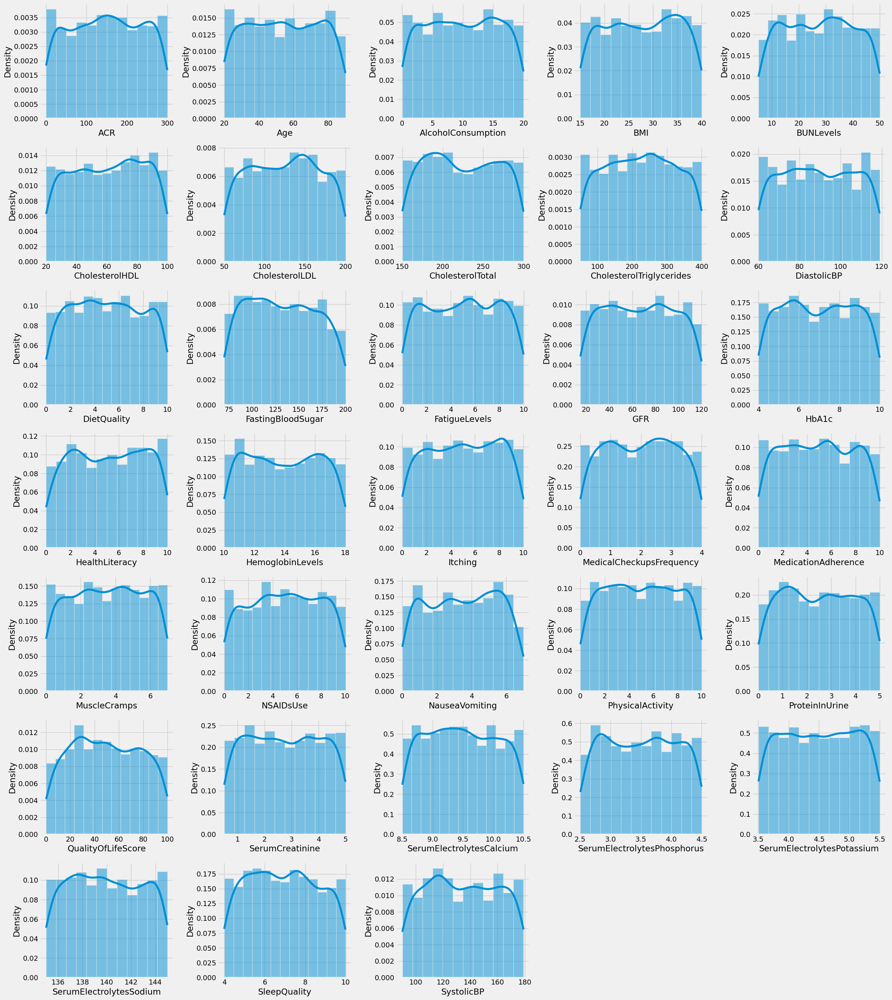

In [11]:
# Visualize numerical features distribution:

# Determine number of plots and subplot grid:
num_plots = len(num_df.columns)
cols = 5
rows = math.ceil(num_plots / cols)

cell_width = 5  # inches per subplot column
cell_height = 4  # inches per subplot row

# Scale figure size with number of rows
plt.figure(figsize=(cols * cell_width, rows * cell_height))

for i, column in enumerate(sorted(num_df.columns), 1):
    ax = plt.subplot(rows, cols, i)
    # Try to use histplot instead of deprecated distplot:
    # sns.histplot(df[column], kde=True, ax=ax)
    # sns.distplot(df[column])
    sns.histplot(num_df[column], kde=True, stat="density", element="bars", ax=ax)
    # Optional styling:
    # sns.rugplot(df[column], ax=ax, color="black", height=0.05)
    ax.set_xlabel(column)

plt.tight_layout()
plt.show()

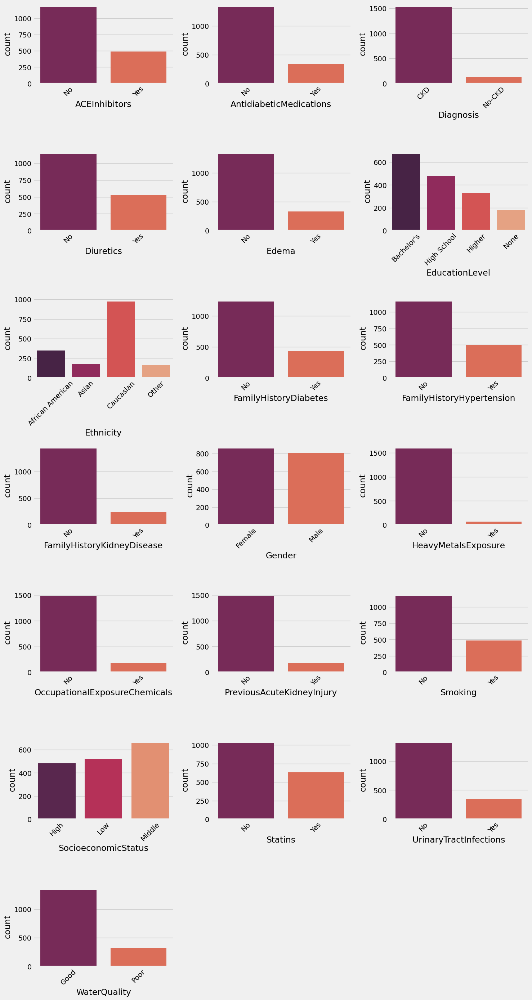

In [12]:
# Visualize categorical column data distribution:

num_plots = len(cat_df.columns)
cols = 3
rows = math.ceil(num_plots / cols)

cell_width = 5  # inches per subplot column
cell_height = 4  # inches per subplot row

plt.figure(figsize=(cols * cell_width, rows * cell_height))

for i, column in enumerate(sorted(cat_df.columns), 1):
    ax = plt.subplot(rows, cols, i)
    sns.countplot(data=cat_df, x=column, hue=column, palette='rocket', legend=False, ax=ax)
    ax.set_xlabel(column)
    # 🔄 Rotate x-axis labels to fit in view:
    for label in ax.get_xticklabels():
        label.set_rotation(45)

plt.tight_layout()
plt.show()

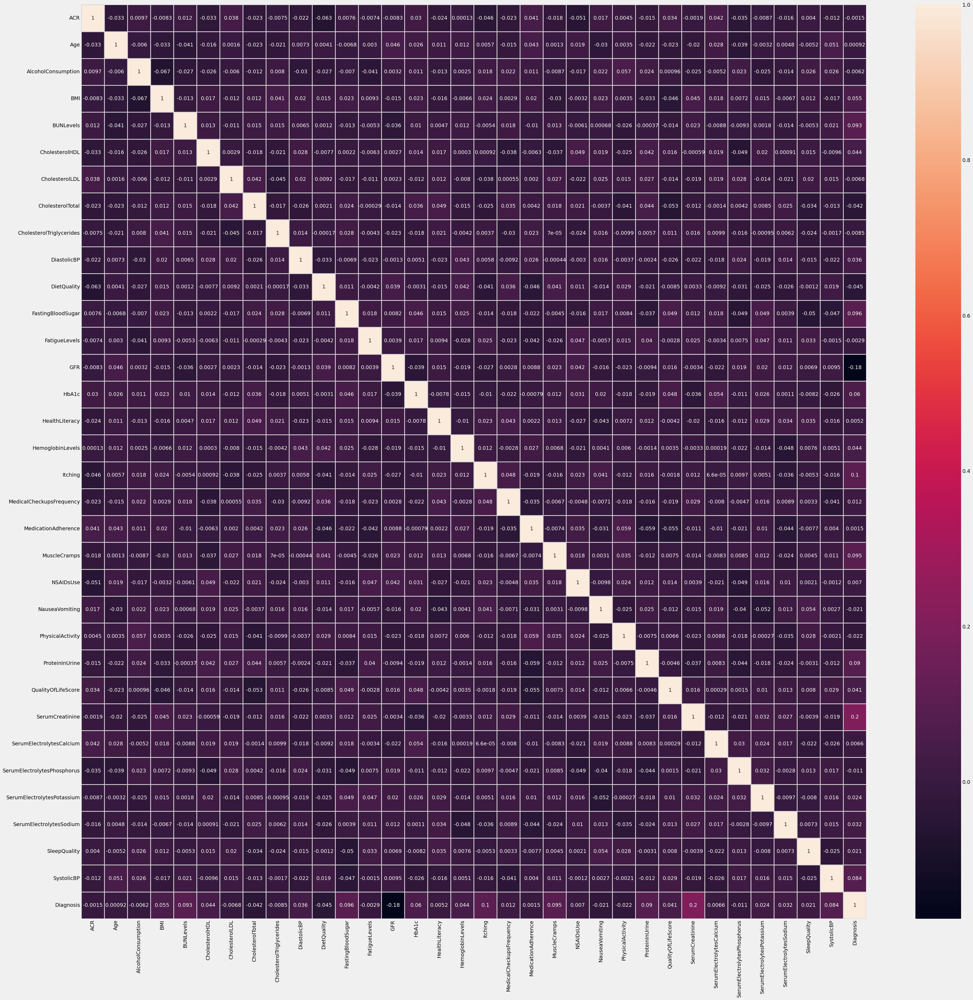

In [13]:
# Heatmap of data:

# Take numerica data and CKD diagnosis:
hm_df = num_df.copy()

# Sort columns and add diagnosis:
hm_cols = sorted(hm_df.columns)
hm_df = hm_df[hm_cols]
hm_df['Diagnosis'] = df['Diagnosis']

cell_size = 1.25  # in inches — adjust to make text readable
columns = hm_df.shape[1]
rows = columns  # square correlation matrix

width = cell_size * columns
height = cell_size * rows

plt.figure(figsize=(width, height))
sns.heatmap(hm_df.corr(numeric_only=True), annot=True, linewidths=2, linecolor='lightgrey')

plt.show()

### Feature Selection:

In [14]:
# Helper display function for long lists:
def wrap(output: list[str], width: int=80) -> str:
    return fill(', '.join(output), width=width)

In [15]:
cutoff = 0.05

# Take numerica data and CKD diagnosis:
cor_df = num_df.copy()

# Sort columns and add diagnosis:
cor_cols = sorted(cor_df.columns)
cor_df = cor_df[cor_cols]
cor_df['Diagnosis'] = df['Diagnosis']

# For numeric columns, only keep those with an absolute correlation > cutoff:
correlations = cor_df.corrwith(cor_df['Diagnosis'])
cor_num_cols = correlations[correlations.abs() > cutoff].index.tolist()
# Remove 'Diagnosis' - not numeric column:
cor_num_cols.pop()

# Original columns:
orig_num_cols = sorted(num_df.columns)
print(f'Original numeric features:\n{wrap(orig_num_cols)}')

# Update dataframe:
num_df = num_df[cor_num_cols]
upd_num_cols = sorted(num_df.columns)

# Removed columns:
rem_num_cols = sorted(set(orig_num_cols) - set(upd_num_cols))
print(f'\nRemoved numeric features:\n{wrap(rem_num_cols)}')

# Resulting columns:
print(f'\nResulting numeric features:\n{wrap(sorted(num_df.columns))}')

Original numeric features:
ACR, Age, AlcoholConsumption, BMI, BUNLevels, CholesterolHDL, CholesterolLDL,
CholesterolTotal, CholesterolTriglycerides, DiastolicBP, DietQuality,
FastingBloodSugar, FatigueLevels, GFR, HbA1c, HealthLiteracy, HemoglobinLevels,
Itching, MedicalCheckupsFrequency, MedicationAdherence, MuscleCramps, NSAIDsUse,
NauseaVomiting, PhysicalActivity, ProteinInUrine, QualityOfLifeScore,
SerumCreatinine, SerumElectrolytesCalcium, SerumElectrolytesPhosphorus,
SerumElectrolytesPotassium, SerumElectrolytesSodium, SleepQuality, SystolicBP

Removed numeric features:
ACR, Age, AlcoholConsumption, CholesterolHDL, CholesterolLDL, CholesterolTotal,
CholesterolTriglycerides, DiastolicBP, DietQuality, FatigueLevels,
HealthLiteracy, HemoglobinLevels, MedicalCheckupsFrequency, MedicationAdherence,
NSAIDsUse, NauseaVomiting, PhysicalActivity, QualityOfLifeScore,
SerumElectrolytesCalcium, SerumElectrolytesPhosphorus,
SerumElectrolytesPotassium, SerumElectrolytesSodium, SleepQuality

Re

In [16]:
from sklearn.feature_selection import f_classif, mutual_info_classif

# Load, prep, split features and outcome
# cat_df already exists
# num_df already exists
y = df['Diagnosis']

# Encode categorical outcome (if needed)
if y.dtype == 'object':
    y = LabelEncoder().fit_transform(y)

# Select only numeric features
X_numeric = num_df.select_dtypes(include='number')

# ANOVA F-test
f_scores, p_values = f_classif(X_numeric, y)
f_test_results = pd.DataFrame({
    'feature': X_numeric.columns,
    'f_score': f_scores,
    'p_value': p_values
}).sort_values(by='f_score', ascending=False)

print(f'ANOVA F-test results:')
display(f_test_results)

# Looking for:
# * High F-score → The feature is likely useful for classification
# * Low p-value (e.g., < 0.05) → The feature’s relationship with the outcome is statistically significant
#
# Filter the rows where p_value < 0.05:
rel_num_cols1 = f_test_results[f_test_results['p_value'] < 0.05]['feature'].tolist()
print(f'Significant/relevant features selected:\n* {"\n* ".join(rel_num_cols1)}')

# Mutual Information
mi_scores = mutual_info_classif(X_numeric, y)
mi_results = pd.Series(mi_scores, index=X_numeric.columns).sort_values(ascending=False)

print('\nMutual Information scores:')
display(mi_results)

# Looking for:
# * Mutual Information used to rank features in terms of value (highest to lowest)
#
# Filter the rows where the socre is 0 (< 0.0000001):
rel_num_cols2 = mi_results[mi_results > 1e-7].index.tolist()
print(f'\n\nSignificant/relevant features selected:\n* {"\n* ".join(rel_num_cols2)}')

# Final column selection:
rel_num_cols = list(set(rel_num_cols1) | set(rel_num_cols2))

# Original columns:
orig_num_cols = sorted(rel_num_cols)
print(f'\nOriginal numeric features:\n{wrap(orig_num_cols)}')

# Update dataframe:
num_df = num_df[rel_num_cols]
upd_num_cols = sorted(num_df.columns)

# Removed columns:
rem_num_cols = sorted(set(orig_num_cols) - set(upd_num_cols))
if rem_num_cols:
    print(f'\nRemoved numeric features:\n{wrap(rem_num_cols)}')
else:
    print('\nNo numeric features removed.')

# Resulting columns:
print(f'\nResulting numeric features:\n{wrap(sorted(num_df.columns))}')

ANOVA F-test results:


,feature,f_score,p_value
8,SerumCreatinine,69.853096,1.334598e-16
3,GFR,52.960318,5.231968e-13
5,Itching,16.958489,4.008818e-05
2,FastingBloodSugar,15.314090,9.471881e-05
6,MuscleCramps,15.030204,1.099348e-04
1,BUNLevels,14.486844,1.462771e-04
7,ProteinInUrine,13.535638,2.415586e-04
9,SystolicBP,11.642036,6.602883e-04
4,HbA1c,5.986631,1.451798e-02
0,BMI,5.068444,2.449580e-02


Significant/relevant features selected:
* SerumCreatinine
* GFR
* Itching
* FastingBloodSugar
* MuscleCramps
* BUNLevels
* ProteinInUrine
* SystolicBP
* HbA1c
* BMI

Mutual Information scores:


SerumCreatinine      0.023041
GFR                  0.016343
FastingBloodSugar    0.012216
ProteinInUrine       0.011825
BUNLevels            0.009362
SystolicBP           0.009255
HbA1c                0.005698
Itching              0.003453
MuscleCramps         0.002311
BMI                  0.000000
dtype: float64



Significant/relevant features selected:
* SerumCreatinine
* GFR
* FastingBloodSugar
* ProteinInUrine
* BUNLevels
* SystolicBP
* HbA1c
* Itching
* MuscleCramps

Original numeric features:
BMI, BUNLevels, FastingBloodSugar, GFR, HbA1c, Itching, MuscleCramps,
ProteinInUrine, SerumCreatinine, SystolicBP

No numeric features removed.

Resulting numeric features:
BMI, BUNLevels, FastingBloodSugar, GFR, HbA1c, Itching, MuscleCramps,
ProteinInUrine, SerumCreatinine, SystolicBP


In [17]:
from sklearn.feature_selection import chi2
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer

# Load, prep, split features and outcome
# cat_df already exists
# num_df already exists
# y = df['Diagnosis'] already exists
X = cat_df.drop(columns=['Diagnosis'])

# Encode outcome if needed
if y.dtype == 'object':
    y = LabelEncoder().fit_transform(y)

# Select categorical features
# X_cat = X.select_dtypes(include='object').copy()

# One-hot encode categorical features
X_encoded = pd.get_dummies(X)

# Run chi-squared test
chi_scores, p_values = chi2(X_encoded, y)
chi2_results = pd.DataFrame({
    'feature': X_encoded.columns,
    'chi2_score': chi_scores,
    'p_value': p_values
}).sort_values(by='chi2_score', ascending=False)

print('Chi-squared test results:')
display(chi2_results)

# Final column selection:
rel_cat_cols = chi2_results[
    (chi2_results['chi2_score'] >= 3) & (chi2_results['p_value'] < 0.10)
]['feature'].tolist()

# Original columns:
orig_num_cols = sorted(cat_df.columns)
print(f'\nOriginal categorical features:\n{wrap(orig_num_cols)}')

# Update dataframe:
rel_cat_cols = list({col.split('_')[0] for col in rel_cat_cols})
cat_df = cat_df[rel_cat_cols]
upd_num_cols = sorted(cat_df.columns)

# Removed columns:
rem_num_cols = sorted(set(orig_num_cols) - set(upd_num_cols))
print(f'\nRemoved categorical features:\n{wrap(rem_num_cols)}')

# Resulting columns:
print(f'\nResulting categorical features:\n{wrap(sorted(cat_df.columns))}')

Chi-squared test results:


,feature,chi2_score,p_value
16,FamilyHistoryKidneyDisease_Yes,3.696938,0.054512
34,Edema_Yes,3.424432,0.064238
11,EducationLevel_Higher,3.321171,0.068393
10,EducationLevel_High School,2.287484,0.130421
6,SocioeconomicStatus_High,2.138338,0.143657
24,UrinaryTractInfections_Yes,1.569855,0.210228
1,Gender_Male,1.525456,0.216796
0,Gender_Female,1.434464,0.231037
28,Diuretics_Yes,0.901684,0.342331
33,Edema_No,0.866454,0.351939



Original categorical features:
ACEInhibitors, AntidiabeticMedications, Diagnosis, Diuretics, Edema,
EducationLevel, Ethnicity, FamilyHistoryDiabetes, FamilyHistoryHypertension,
FamilyHistoryKidneyDisease, Gender, HeavyMetalsExposure,
OccupationalExposureChemicals, PreviousAcuteKidneyInjury, Smoking,
SocioeconomicStatus, Statins, UrinaryTractInfections, WaterQuality

Removed categorical features:
ACEInhibitors, AntidiabeticMedications, Diagnosis, Diuretics, Ethnicity,
FamilyHistoryDiabetes, FamilyHistoryHypertension, Gender, HeavyMetalsExposure,
OccupationalExposureChemicals, PreviousAcuteKidneyInjury, Smoking,
SocioeconomicStatus, Statins, UrinaryTractInfections, WaterQuality

Resulting categorical features:
Edema, EducationLevel, FamilyHistoryKidneyDisease


In [18]:
# Original columns:
orig_cols = sorted(df.columns)
print(f'Original dataset features:\n{wrap(orig_cols)}')

# Diagnosis column:
ckd_col_list = ['Diagnosis']

# Create updated dataframe columns:
rel_cols = rel_num_cols + rel_cat_cols + ckd_col_list

# Update dataframe:
df = df[rel_cols]
upd_cols = sorted(df.columns)

# Removed columns:
rem_cols = sorted(set(orig_cols) - set(upd_cols))
print(f'\nRemoved dataset features:\n{wrap(rem_cols)}')

# Resulting columns:
print(f'\nResulting dataset features:\n{wrap(sorted(df.columns))}')

Original dataset features:
ACEInhibitors, ACR, Age, AlcoholConsumption, AntidiabeticMedications, BMI,
BUNLevels, CholesterolHDL, CholesterolLDL, CholesterolTotal,
CholesterolTriglycerides, Diagnosis, DiastolicBP, DietQuality, Diuretics, Edema,
EducationLevel, Ethnicity, FamilyHistoryDiabetes, FamilyHistoryHypertension,
FamilyHistoryKidneyDisease, FastingBloodSugar, FatigueLevels, GFR, Gender,
HbA1c, HealthLiteracy, HeavyMetalsExposure, HemoglobinLevels, Itching,
MedicalCheckupsFrequency, MedicationAdherence, MuscleCramps, NSAIDsUse,
NauseaVomiting, OccupationalExposureChemicals, PhysicalActivity,
PreviousAcuteKidneyInjury, ProteinInUrine, QualityOfLifeScore, SerumCreatinine,
SerumElectrolytesCalcium, SerumElectrolytesPhosphorus,
SerumElectrolytesPotassium, SerumElectrolytesSodium, SleepQuality, Smoking,
SocioeconomicStatus, Statins, SystolicBP, UrinaryTractInfections, WaterQuality

Removed dataset features:
ACEInhibitors, ACR, Age, AlcoholConsumption, AntidiabeticMedications,
Cholester

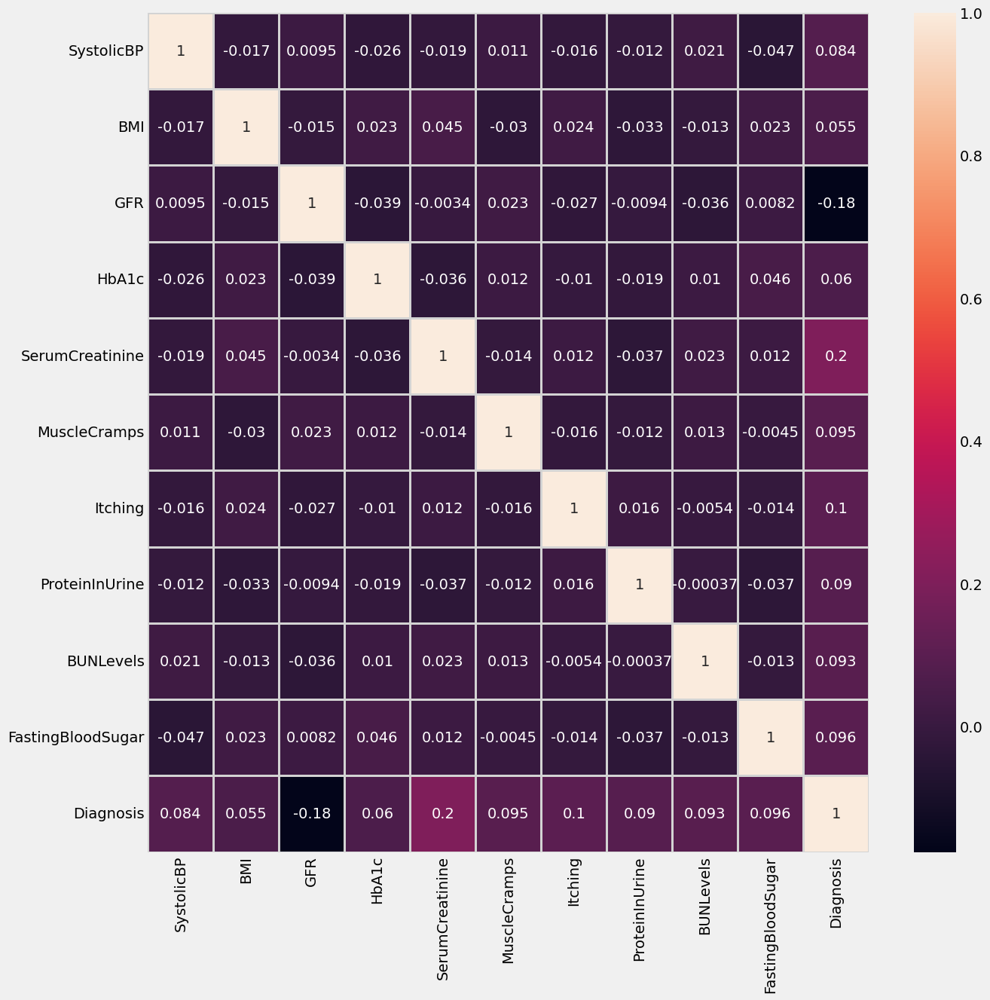

In [19]:
# Revisit Heatmap of data:

# Take numerica data and CKD diagnosis:
hm_df = num_df.copy()
hm_df['Diagnosis'] = df['Diagnosis']

cell_size = 1.25  # in inches — adjust to make text readable
columns = hm_df.shape[1]
rows = columns  # square correlation matrix

width = cell_size * columns
height = cell_size * rows

plt.figure(figsize=(width, height))
sns.heatmap(hm_df.corr(numeric_only=True), annot=True, linewidths=2, linecolor='lightgrey')

plt.show()

### Data Cleaning:

In [20]:
# Check for null values:
df.isna().sum().sort_values(ascending = False)

SystolicBP                    0
BMI                           0
GFR                           0
HbA1c                         0
SerumCreatinine               0
MuscleCramps                  0
Itching                       0
ProteinInUrine                0
BUNLevels                     0
FastingBloodSugar             0
EducationLevel                0
Edema                         0
FamilyHistoryKidneyDisease    0
Diagnosis                     0
dtype: int64

### Feature Encoding:

In [21]:
# Not needed - all values began as numerical

### Label Encoding:

In [22]:
# Not needed - all values began as numerical

<a id = '5.0'></a>
<p style = "font-size : 45px; color : #34656d ; font-family : 'Comic Sans MS'; text-align : center; background-color : #f9b208; border-radius: 5px 5px;"><strong>Model Building</strong></p> 

In [23]:
ckd_col = 'Diagnosis'

ind_col = [col for col in df.columns if col != ckd_col]
dep_col = ckd_col

X = df[ind_col]
y = df[dep_col]

In [24]:
# Split data into training and test sets:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 0)

In [25]:
# Build confusion matrix results dataframe:
def get_cm_results(cm):
    # cm is the result of sklearn.metrics.confusion_matrix(y_test, classifier.predict(X_test))
    tn, fp, fn, tp = cm.ravel()
    data = [
        {'Result': 'True Positive', 'Number': tp,
         'Description': 'Actual occurrence, correctly predicted'},
        {'Result': 'True Negative', 'Number': tn,
         'Description': 'Non-occurrence, correctly predicted'},
        {'Result': 'False Negative', 'Number': fn,
         'Description': 'Actual occurrence, incorrectly predicted (Type II error)'},
        {'Result': 'False Positive', 'Number': fp,
         'Description': 'Non-occurrence, incorrectly predicted (Type I error)'},
    ]
    return pd.DataFrame(data).style.set_properties(
        subset=['Description'], **{'text-align': 'left'}
    ).hide(axis='index')


# Build confusion matrix metrics dataframe:
def get_cm_metrics(cm):
    # cm is the result of sklearn.metrics.confusion_matrix(y_test, classifier.predict(X_test))
    tn, fp, fn, tp = cm.ravel()
    prec_val = tp/(tp + fp)
    rec_val = tp/(tp + fn)
    data = [
        {'Metric': 'Accuracy', 'Value': (tp + tn)/(tp + tn + fp + fn),
         'Description': 'How often is classifier correct'},
        {'Metric': 'Precision', 'Value': prec_val,
         'Description': 'How often is TP correctly predicted (% of correct positives)'},
        {'Metric': 'Recall', 'Value': rec_val,
         'Description': 'How often is actual occurrence correctly predicted'},
        {'Metric': 'F1-Score', 'Value': (2 * prec_val * rec_val)/(prec_val + rec_val),
         'Description': 'Account for both precision and recall using harmonic mean'},
        {'Metric': 'Misclassification', 'Value': (fp + fn)/(tp + tn + fp + fn),
         'Description': 'How often is classifier wrong'},
        {'Metric': 'NPV', 'Value': tn/(tn + fn),
         'Description': 'How often is TN correctly predicted (% of correct negatives)'},
        {'Metric': 'FPR', 'Value': fp/(tn + fp),
         'Description': 'How often is non-occurrence falsely predicted'},
        {'Metric': 'Specificity', 'Value': tn/(tn + fp),
         'Description': 'How often is actual non-occurrence correctly predicted'},
        {'Metric': 'Prevalence', 'Value': (fn + tp)/(tp + tn + fp + fn),
         'Description': 'How often does actually occur in sample'},
    ]
    return pd.DataFrame(data).style.set_properties(
        subset=['Description'], **{'text-align': 'left'}
    ).format({'Value': '{:.2%}'}).hide(axis='index')

# Plot confusion matrix heatmap:
def cm_heatmap(cm):
    classes = ['No CKD', 'CKD']
    df_cm = pd.DataFrame(cm, index=classes, columns=classes)
    
    # Flip horizontally and vertically
    df_cm = df_cm.iloc[::-1, ::-1]
    
    plt.figure(figsize=(5,4))
    sns.heatmap(df_cm, annot=True, fmt='d', cmap='coolwarm_r',
                linewidths=0.5, cbar_kws={'label': 'Count'})
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix Heatmap')
    return plt.show()

# Track results by saving/serializing:
def save_cm(cm, model):
    # cm is the result of sklearn.metrics.confusion_matrix(y_test, classifier.predict(X_test))
    tn, fp, fn, tp = cm.ravel()
    prec_val = tp/(tp + fp)
    rec_val = tp/(tp + fn)
    accuracy = (tp + tn)/(tp + tn + fp + fn)
    precision = prec_val
    recall = rec_val
    f1_score = (2 * prec_val * rec_val)/(prec_val + rec_val)
    misclassification = (fp + fn)/(tp + tn + fp + fn)
    npv = tn/(tn + fn)
    fpr = fp/(tn + fp)
    specificity = tn/(tn + fp)
    prevalence = (fn + tp)/(tp + tn + fp + fn)
    model_name = model if isinstance(model, str) else model.__class__.__name__
    imputation = IMPUTATION

    # Safety check in case Notebook run directly:
    run_id = globals().get('run_id', 0)
    with shelve.open(run_file) as db:
        db[f'{run_id}/{model_name}'] = dict(
            true_positive=tp, true_negative=tn, false_negative=fn, false_postive=fp,
            accuracy=accuracy, precision=precision, recall=recall, f1_score=f1_score,
            misclassification=misclassification, npv=npv, fpr=fpr, specificity=specificity,
            prevalence=prevalence, imputation=imputation
        )

<a id = '5.2'></a>
<p style = "font-size : 25px; color : #34656d ; font-family : 'Comic Sans MS'; text-align : center; background-color : #fbc6a4; border-radius: 5px 5px;"><strong>Decision Tree Classifier</strong></p> 

In [26]:
dtc = DecisionTreeClassifier()
dtc.fit(X_train, y_train)

# Accuracy score, confusion matrix and classification report of decision tree:
dtc_acc = accuracy_score(y_test, dtc.predict(X_test))

print(f"Training Accuracy of Decision Tree Classifier is {accuracy_score(y_train, dtc.predict(X_train))}")
print(f"Test Accuracy of Decision Tree Classifier is {dtc_acc} \n")

cm = confusion_matrix(y_test, dtc.predict(X_test))
print(f"Confusion Matrix :- \n{cm}\n")
print(f"Classification Report :- \n {classification_report(y_test, dtc.predict(X_test))}")

Training Accuracy of Decision Tree Classifier is 1.0
Test Accuracy of Decision Tree Classifier is 0.8775100401606426 

Confusion Matrix :- 
[[ 17  29]
 [ 32 420]]

Classification Report :- 
               precision    recall  f1-score   support

           0       0.35      0.37      0.36        46
           1       0.94      0.93      0.93       452

    accuracy                           0.88       498
   macro avg       0.64      0.65      0.65       498
weighted avg       0.88      0.88      0.88       498



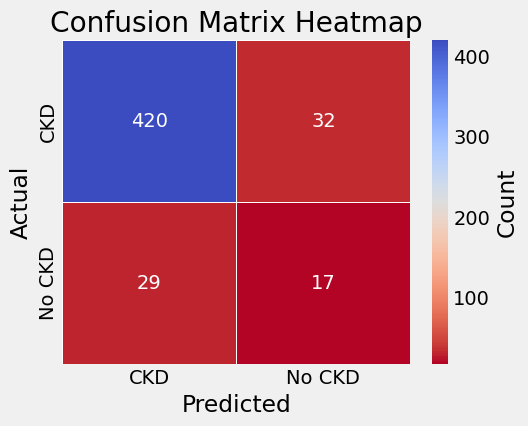

Result,Number,Description
True Positive,420,"Actual occurrence, correctly predicted"
True Negative,17,"Non-occurrence, correctly predicted"
False Negative,32,"Actual occurrence, incorrectly predicted (Type II error)"
False Positive,29,"Non-occurrence, incorrectly predicted (Type I error)"


Metric,Value,Description
Accuracy,87.75%,How often is classifier correct
Precision,93.54%,How often is TP correctly predicted (% of correct positives)
Recall,92.92%,How often is actual occurrence correctly predicted
F1-Score,93.23%,Account for both precision and recall using harmonic mean
Misclassification,12.25%,How often is classifier wrong
NPV,34.69%,How often is TN correctly predicted (% of correct negatives)
FPR,63.04%,How often is non-occurrence falsely predicted
Specificity,36.96%,How often is actual non-occurrence correctly predicted
Prevalence,90.76%,How often does actually occur in sample


In [27]:
# Plot confusion matrix heatmap:
cm_heatmap(cm)

# Show classifier results and metrics:
display(get_cm_results(cm))
display(get_cm_metrics(cm))

# Track results:
save_cm(cm, dtc)

In [28]:
# Hyper parameter tuning of decision tree:

# Input hyper paramter to choose from to find the best estimator to increase the accuracy
# and avoid overfitting of the model:
grid_param = {
    'criterion' : ['gini', 'entropy'],
    'max_depth' : [3, 5, 7, 10],
    'splitter' : ['best', 'random'],
    'min_samples_leaf' : [1, 2, 3, 5, 7],
    'min_samples_split' : [2, 3, 5, 7],
    'max_features' : ['sqrt', 'log2']  # How many input features the tree considers to build the model
}

# Use GridSearchCV to try provided different compbination of hyper parameter:
grid_search_dtc = GridSearchCV(dtc, grid_param, cv = 5, n_jobs = -1, verbose = 1)
grid_search_dtc.fit(X_train, y_train)

Fitting 5 folds for each of 640 candidates, totalling 3200 fits


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [3, 5, 7, 10],
                         'max_features': ['sqrt', 'log2'],
                         'min_samples_leaf': [1, 2, 3, 5, 7],
                         'min_samples_split': [2, 3, 5, 7],
                         'splitter': ['best', 'random']},
             verbose=1)

In [29]:
# Best parameters and best score:
print(grid_search_dtc.best_params_)
print(grid_search_dtc.best_score_)

{'criterion': 'gini', 'max_depth': 7, 'max_features': 'sqrt', 'min_samples_leaf': 5, 'min_samples_split': 3, 'splitter': 'random'}
0.926787035666716


In [30]:
# Best estimator:
dtc = grid_search_dtc.best_estimator_

# Accuracy score, confusion matrix and classification report of decision tree
dtc_acc = accuracy_score(y_test, dtc.predict(X_test))

print(
    "Training Accuracy of Decision Tree Classifier - Hyperparameter best estimator is "
      f"{accuracy_score(y_train, dtc.predict(X_train))}"
)
print(f"Test Accuracy of Decision Tree Classifier - Hyperparameter best estimator is {dtc_acc} \n")

cm = confusion_matrix(y_test, dtc.predict(X_test))
print(f"Confusion Matrix after hyperparameter tuning :- \n{cm}\n")
print(
    "Classification Report after hyperparameter tuning :- \n "
    f"{classification_report(y_test, dtc.predict(X_test))}"
)

Training Accuracy of Decision Tree Classifier - Hyperparameter best estimator is 0.9276485788113695
Test Accuracy of Decision Tree Classifier - Hyperparameter best estimator is 0.9096385542168675 

Confusion Matrix after hyperparameter tuning :- 
[[  6  40]
 [  5 447]]

Classification Report after hyperparameter tuning :- 
               precision    recall  f1-score   support

           0       0.55      0.13      0.21        46
           1       0.92      0.99      0.95       452

    accuracy                           0.91       498
   macro avg       0.73      0.56      0.58       498
weighted avg       0.88      0.91      0.88       498



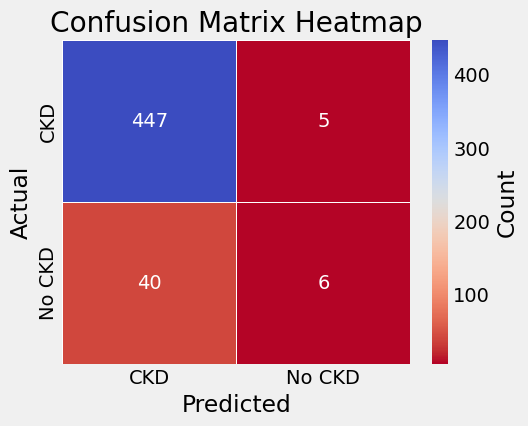

Result,Number,Description
True Positive,447,"Actual occurrence, correctly predicted"
True Negative,6,"Non-occurrence, correctly predicted"
False Negative,5,"Actual occurrence, incorrectly predicted (Type II error)"
False Positive,40,"Non-occurrence, incorrectly predicted (Type I error)"


Metric,Value,Description
Accuracy,90.96%,How often is classifier correct
Precision,91.79%,How often is TP correctly predicted (% of correct positives)
Recall,98.89%,How often is actual occurrence correctly predicted
F1-Score,95.21%,Account for both precision and recall using harmonic mean
Misclassification,9.04%,How often is classifier wrong
NPV,54.55%,How often is TN correctly predicted (% of correct negatives)
FPR,86.96%,How often is non-occurrence falsely predicted
Specificity,13.04%,How often is actual non-occurrence correctly predicted
Prevalence,90.76%,How often does actually occur in sample


In [31]:
# Plot confusion matrix heatmap:
cm_heatmap(cm)

# Show classifier results and metrics:
display(get_cm_results(cm))
display(get_cm_metrics(cm))

# Track results:
save_cm(cm, 'DecisionTreeClassifier-GridSearchCV')

<a id = '5.3'></a>
<p style = "font-size : 25px; color : #34656d ; font-family : 'Comic Sans MS'; text-align : center; background-color : #fbc6a4; border-radius: 5px 5px;"><strong>Random Forest Classifier</strong></p>

In [32]:
# Note:  The default for max_features changed from 'auto' to 'sqrt', updating:
# Direct initialization of RandomForestClassifier object for specific hyperparamter value.
# Not using RandomizedSearchCV for the tunning.
rd_clf = RandomForestClassifier(
    criterion = 'entropy', max_depth = 11, max_features = 'sqrt',
    min_samples_leaf = 2, min_samples_split = 3, n_estimators = 130
)
rd_clf.fit(X_train, y_train)

# Accuracy score, confusion matrix and classification report of random forest:
rd_clf_acc = accuracy_score(y_test, rd_clf.predict(X_test))

print(f"Training Accuracy of Random Forest Classifier is {accuracy_score(y_train, rd_clf.predict(X_train))}")
print(f"Test Accuracy of Random Forest Classifier is {rd_clf_acc} \n")

cm = confusion_matrix(y_test, rd_clf.predict(X_test))
print(f"Confusion Matrix :- \n{cm}\n")
print(
    "Classification Report :- \n "
    # Can change zero_division parameter to 0 to suppress warning:
    # This happens when TP & FP = 0 and/or TP & FN = 0
    f"{classification_report(y_test, rd_clf.predict(X_test), zero_division='warn')}"
)

Training Accuracy of Random Forest Classifier is 0.9844961240310077
Test Accuracy of Random Forest Classifier is 0.9136546184738956 

Confusion Matrix :- 
[[  4  42]
 [  1 451]]

Classification Report :- 
               precision    recall  f1-score   support

           0       0.80      0.09      0.16        46
           1       0.91      1.00      0.95       452

    accuracy                           0.91       498
   macro avg       0.86      0.54      0.56       498
weighted avg       0.90      0.91      0.88       498



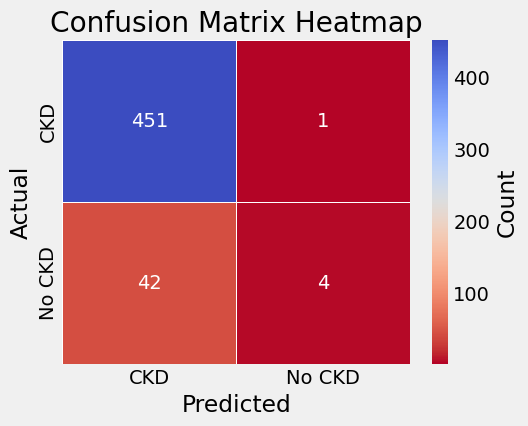

Result,Number,Description
True Positive,451,"Actual occurrence, correctly predicted"
True Negative,4,"Non-occurrence, correctly predicted"
False Negative,1,"Actual occurrence, incorrectly predicted (Type II error)"
False Positive,42,"Non-occurrence, incorrectly predicted (Type I error)"


Metric,Value,Description
Accuracy,91.37%,How often is classifier correct
Precision,91.48%,How often is TP correctly predicted (% of correct positives)
Recall,99.78%,How often is actual occurrence correctly predicted
F1-Score,95.45%,Account for both precision and recall using harmonic mean
Misclassification,8.63%,How often is classifier wrong
NPV,80.00%,How often is TN correctly predicted (% of correct negatives)
FPR,91.30%,How often is non-occurrence falsely predicted
Specificity,8.70%,How often is actual non-occurrence correctly predicted
Prevalence,90.76%,How often does actually occur in sample


In [33]:
# Plot confusion matrix heatmap:
cm_heatmap(cm)

# Show classifier results and metrics:
display(get_cm_results(cm))
display(get_cm_metrics(cm))

# Track results:
save_cm(cm, rd_clf)

<a id = '5.3'></a>
<p style = "font-size : 25px; color : #34656d ; font-family : 'Comic Sans MS'; text-align : center; background-color : #fbc6a4; border-radius: 5px 5px;"><strong>XgBoost</strong></p>

In [34]:
# Use of the XGBoost (Extreme Gradient Boosting) algorithm for a binary classification task
xgb = XGBClassifier(objective = 'binary:logistic', learning_rate = 0.5, max_depth = 5, n_estimators = 150)
xgb.fit(X_train, y_train)

# accuracy score, confusion matrix and classification report of xgboost
xgb_acc = accuracy_score(y_test, xgb.predict(X_test))

print(f"Training Accuracy of XgBoost is {accuracy_score(y_train, xgb.predict(X_train))}")
print(f"Test Accuracy of XgBoost is {xgb_acc} \n")

cm = confusion_matrix(y_test, xgb.predict(X_test))
print(f"Confusion Matrix :- \n{cm}\n")
print(f"Classification Report :- \n {classification_report(y_test, xgb.predict(X_test))}")

Training Accuracy of XgBoost is 1.0
Test Accuracy of XgBoost is 0.9257028112449799 

Confusion Matrix :- 
[[ 14  32]
 [  5 447]]

Classification Report :- 
               precision    recall  f1-score   support

           0       0.74      0.30      0.43        46
           1       0.93      0.99      0.96       452

    accuracy                           0.93       498
   macro avg       0.84      0.65      0.70       498
weighted avg       0.92      0.93      0.91       498



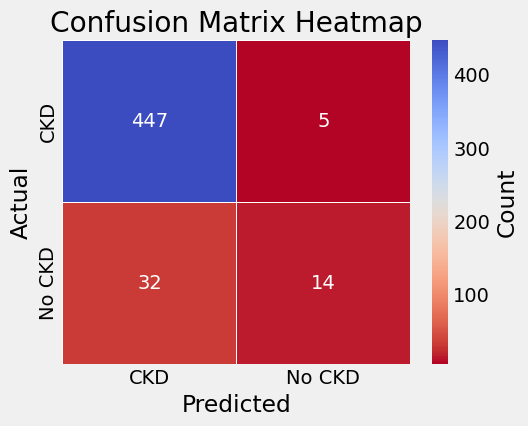

Result,Number,Description
True Positive,447,"Actual occurrence, correctly predicted"
True Negative,14,"Non-occurrence, correctly predicted"
False Negative,5,"Actual occurrence, incorrectly predicted (Type II error)"
False Positive,32,"Non-occurrence, incorrectly predicted (Type I error)"


Metric,Value,Description
Accuracy,92.57%,How often is classifier correct
Precision,93.32%,How often is TP correctly predicted (% of correct positives)
Recall,98.89%,How often is actual occurrence correctly predicted
F1-Score,96.03%,Account for both precision and recall using harmonic mean
Misclassification,7.43%,How often is classifier wrong
NPV,73.68%,How often is TN correctly predicted (% of correct negatives)
FPR,69.57%,How often is non-occurrence falsely predicted
Specificity,30.43%,How often is actual non-occurrence correctly predicted
Prevalence,90.76%,How often does actually occur in sample


In [35]:
# Plot confusion matrix heatmap:
cm_heatmap(cm)

# Show classifier results and metrics:
display(get_cm_results(cm))
display(get_cm_metrics(cm))

# Track results:
save_cm(cm, xgb)

<a id = '5.3'></a>
<p style = "font-size : 25px; color : #34656d ; font-family : 'Comic Sans MS'; text-align : center; background-color : #fbc6a4; border-radius: 5px 5px;"><strong>Logistic Regression</strong></p>

In [36]:
# Use of the Logistic Regression algorithm for a binary classification task
# liblinear is good for smaller datasets. For larger datasets, solvers like 'lbfgs'
# or 'saga' may perform better.  This parameter sets the seed for the random number
# generator used by the model. Setting a random_state ensures that the results are
# reproducible. If you run the code multiple times with the same random_state, you'll
# get the same results.
logistic_regression = LogisticRegression(solver='liblinear', random_state=42) 

logistic_regression.fit(X_train, y_train)

# accuracy score, confusion matrix and classification report of logistic regression
logistic_acc = accuracy_score(y_test, logistic_regression.predict(X_test))

print(
    "Training Accuracy of Logistic Regression is "
    f"{accuracy_score(y_train, logistic_regression.predict(X_train))}"
)
print(f"Test Accuracy of Logistic Regression is {logistic_acc} \n")

cm = confusion_matrix(y_test, logistic_regression.predict(X_test))
print(f"Confusion Matrix :- \n{cm}\n")
print(
    "Classification Report :- \n "
    f"{classification_report(y_test, logistic_regression.predict(X_test))}"
)

Training Accuracy of Logistic Regression is 0.9293712316968131
Test Accuracy of Logistic Regression is 0.9136546184738956 

Confusion Matrix :- 
[[  5  41]
 [  2 450]]

Classification Report :- 
               precision    recall  f1-score   support

           0       0.71      0.11      0.19        46
           1       0.92      1.00      0.95       452

    accuracy                           0.91       498
   macro avg       0.82      0.55      0.57       498
weighted avg       0.90      0.91      0.88       498



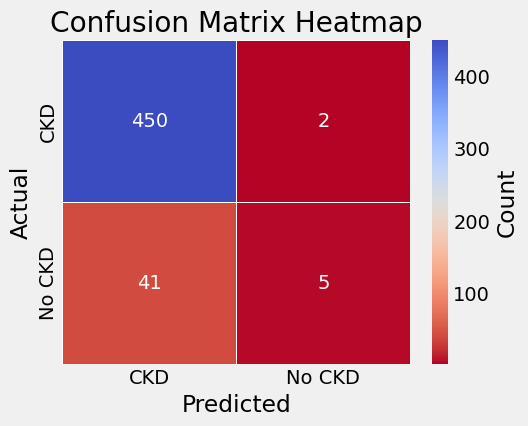

Result,Number,Description
True Positive,450,"Actual occurrence, correctly predicted"
True Negative,5,"Non-occurrence, correctly predicted"
False Negative,2,"Actual occurrence, incorrectly predicted (Type II error)"
False Positive,41,"Non-occurrence, incorrectly predicted (Type I error)"


Metric,Value,Description
Accuracy,91.37%,How often is classifier correct
Precision,91.65%,How often is TP correctly predicted (% of correct positives)
Recall,99.56%,How often is actual occurrence correctly predicted
F1-Score,95.44%,Account for both precision and recall using harmonic mean
Misclassification,8.63%,How often is classifier wrong
NPV,71.43%,How often is TN correctly predicted (% of correct negatives)
FPR,89.13%,How often is non-occurrence falsely predicted
Specificity,10.87%,How often is actual non-occurrence correctly predicted
Prevalence,90.76%,How often does actually occur in sample


In [37]:
# Plot confusion matrix heatmap:
cm_heatmap(cm)

# Show classifier results and metrics:
display(get_cm_results(cm))
display(get_cm_metrics(cm))

# Track results:
save_cm(cm, logistic_regression)

<a id = '6.0'></a>
<p style = "font-size : 35px; color : #34656d ; font-family : 'Comic Sans MS'; text-align : center; background-color : #f9b208; border-radius: 5px 5px;"><strong>Models Comparison</strong></p> 

In [38]:
models = pd.DataFrame({
    'Model' : ['Decision Tree Classifier', 'Random Forest Classifier', 'XgBoost', 'Logistic Regression'],
    'Score' : [dtc_acc, rd_clf_acc, xgb_acc, logistic_acc]
})

models.sort_values(by='Score', ascending=False)

,Model,Score
2,XgBoost,0.925703
1,Random Forest Classifier,0.913655
3,Logistic Regression,0.913655
0,Decision Tree Classifier,0.909639


In [39]:
# Flip sort order to show best model at the top:
models_sorted = models.sort_values(by='Score', ascending=True)

fig = px.bar(
    data_frame=models_sorted,
    x='Score',
    y='Model',
    color='Score',
    template='plotly_dark',
    title='Models Comparison'
)
fig.show()

### Select XGBoost model - more reliable:

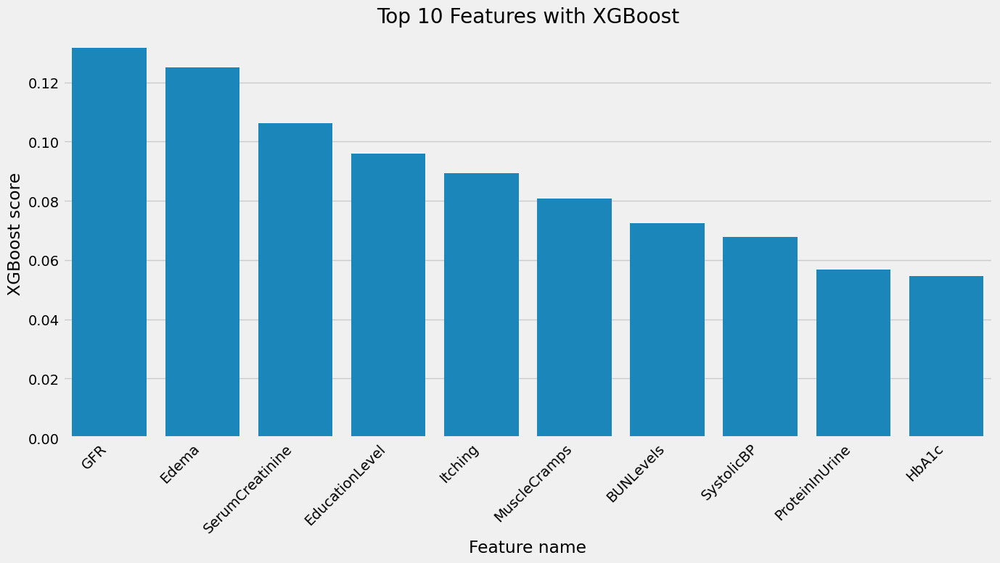

In [40]:
# Top 10 Features:
feature_scores = pd.DataFrame(
    xgb.feature_importances_, columns=['Score'], index=X_train.columns
).sort_values(by='Score', ascending=False)
top10_features = feature_scores.nlargest(n=10, columns=['Score'])

plt.figure(figsize=(14, 8))
g = sns.barplot(x=top10_features.index, y=top10_features['Score'])
p = plt.title('Top 10 Features with XGBoost')
p = plt.xlabel('Feature name')
p = plt.ylabel('XGBoost score')

# Rotate x-axis tick labels
for tick in g.get_xticklabels():
    tick.set_rotation(45)
    tick.set_horizontalalignment('right')

plt.tight_layout()
plt.show()

In [41]:
top10_features = top10_features.index.tolist()
top10_features

['GFR',
 'Edema',
 'SerumCreatinine',
 'EducationLevel',
 'Itching',
 'MuscleCramps',
 'BUNLevels',
 'SystolicBP',
 'ProteinInUrine',
 'HbA1c']

In [42]:
# Current columns:
X.columns

Index(['SystolicBP', 'BMI', 'GFR', 'HbA1c', 'SerumCreatinine', 'MuscleCramps',
       'Itching', 'ProteinInUrine', 'BUNLevels', 'FastingBloodSugar',
       'EducationLevel', 'Edema', 'FamilyHistoryKidneyDisease'],
      dtype='object')

In [43]:
# Prune columns not in top 10:
for ele in X.columns:
    if ele not in top10_features:
        X = X.drop(ele, axis = 1)

# Display:
X.head()

,SystolicBP,GFR,HbA1c,SerumCreatinine,MuscleCramps,Itching,ProteinInUrine,BUNLevels,EducationLevel,Edema
0,113,45.703204,9.212397,4.962531,4.518513,7.556302,0.744980,25.605949,2,0
1,120,55.784504,4.604989,3.156799,2.202222,6.836766,3.052317,31.338166,3,0
2,147,67.559032,5.432599,3.698236,5.967271,2.144722,1.157839,39.738169,1,0
3,117,33.202542,4.144466,2.868468,2.176387,7.077188,3.745871,21.980958,1,0
4,98,56.319082,4.262979,3.964877,6.800993,3.553118,2.570993,12.216366,2,0


In [44]:
X_train=X_train[top10_features]
X_test=X_test[top10_features]
xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.5, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=150, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

### Testing Predictions:

In [45]:
# XGBoost feature ordering must match - training order and patient data order
def get_ordered_pd_df(df: pd.DataFrame, patient_id: int, columns: list[str]) -> pd.DataFrame:
    """
    Extract a single row from the DataFrame by PatientID and return only the selected
    columns in the specified order.
    
    Parameters:
    - df: The source DataFrame.
    - patient_id: The PatientID identifying the row.
    - columns: A list of columns to include in the returned row (in order).
    
    Returns:
    - A DataFrame with one row and only the specified columns.
    """
    return df.loc[df['PatientID'] == patient_id, columns]

In [46]:
# Prediction 1 - CKD:
patient_id = 7

# Use Original DataFrame which retains PatientID column:
pd_df = get_ordered_pd_df(orig_df, patient_id, top10_features)
prediction = xgb.predict(pd_df)[0]

if prediction:
    print('Unfortunately, you have Chronic Kidney Disease.')
else:
    print("Fortunately, you don't have Chronic Kidney Disease.")

Unfortunately, you have Chronic Kidney Disease.


In [47]:
# Prediction 2 - No CKD:
patient_id = 8

# Use Original DataFrame which retains PatientID column:
pd_df = get_ordered_pd_df(orig_df, patient_id, top10_features)
prediction = xgb.predict(pd_df)[0]

if prediction:
    print('Unfortunately, you have Chronic Kidney Disease.')
else:
    print("Fortunately, you don't have Chronic Kidney Disease.")

Fortunately, you don't have Chronic Kidney Disease.


### Serialize and save model:

In [48]:
pickle.dump(xgb, open('CKD-XGB-Kaggle.pkl', 'wb'))